# GRAPHML-NY


Emergency response times based on the locations of emergency lines, crime locations, vehicular crashes and fire accidents with real-time traffic data.

# Install and Import Dependencies

In [220]:
%pip install osmnx  #Installing Library

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


ERROR: Invalid requirement: '#Installing'
C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedWriter name=4>
  return process_handler(cmd, _system_body)
C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedReader name=8>
  return process_handler(cmd, _system_body)
C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedReader name=9>
  return process_handler(cmd, _system_body)


In [221]:
#not nessary if you have the libraries installed
%pip install matplotlib
%pip install geopandas
%pip install pandas
%pip install numpy
%pip install networkx
%pip install folium
%pip install shapely
%pip install seaborn
%pip install  momepy


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.12_3.12.1008.0_x64__qbz5n2kfra8p0\Lib\threading.py:1014: ResourceWarning: unclosed file <_io.BufferedWriter name=4>
  del self._target, self._args, self._kwargs
C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.12_3.12.1008.0_x64__qbz5n2kfra8p0\Lib\threading.py:1014: ResourceWarning: unclosed file <_io.BufferedReader name=8>
  del self._target, self._args, self._kwargs
C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.12_3.12.1008.0_x64__qbz5n2kfra8p0\Lib\threading.py:1014: ResourceWarning: unclosed file <_io.BufferedReader name=9>
  del self._target, self._args, self._kwargs


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedWriter name=10>
  return process_handler(cmd, _system_body)
C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedReader name=11>
  return process_handler(cmd, _system_body)
C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedReader name=12>
  return process_handler(cmd, _system_body)


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [222]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns  
import numpy as np
import pandas as pd
import osmnx as ox
import networkx as nx
import geopandas as gpd
from shapely.geometry import Point, Polygon, box, MultiPoint
import momepy #we need this lib to easily convert gdf to nx graphs
import urllib.request
from collections import Counter

# Building the Graph

### Get City Graph

In [230]:
place_name= 'New York, United States'
G = ox.graph_from_place(place_name, network_type='drive', simplify=True) #network types: walk, drive, bike, drive_service, all, all_private

In [231]:
pcs="epsg:4326"  #project the graph from a geographic to a projected coordinates system
G=ox.project_graph(G,to_crs=pcs)

### Convert to Dataframe

In [232]:
#Retrieve nodes and edges from the graph
nodes, edges = ox.graph_to_gdfs(G)

In [233]:
#Get boundary area by a place name
boundary = ox.geocode_to_gdf(place_name)
boundary=ox.projection.project_gdf(boundary, to_crs=pcs, to_latlong=False)    

### Get Boundary

In [234]:
area = ox.geocode_to_gdf(place_name)
area

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"MULTIPOLYGON (((-74.25884 40.49887, -74.25814 ...",40.91763,40.476578,-73.700233,-74.258843,389518145,relation,175905,40.712728,-74.006015,boundary,administrative,10,0.817577,city,New York,"New York, United States"


### Plot City Graph

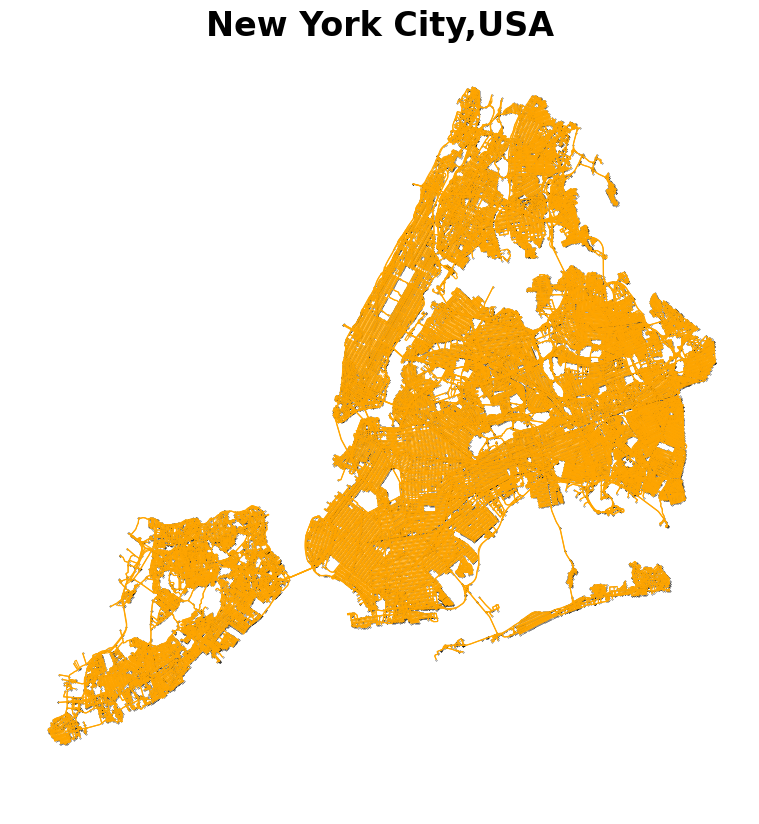

In [235]:
 #Create the plot with specified figure size
fig, ax = plt.subplots(figsize=(10, 10))

# Set the background color of the plot
area.plot(ax=ax, facecolor='White')
nodes.plot(ax=ax, color='k', markersize=0.05)
edges.plot(ax=ax, linewidth=0.8, edgecolor='orange')

# Add a title with a larger font size
plt.title("New York City,USA", fontsize=24, fontweight='bold')

# Save the plot to a file
plt.savefig('00_nyc_plot.pdf', format='pdf', bbox_inches='tight', pad_inches=0.1)
plt.axis('off')

# Show the plot
plt.show()

In [236]:
print(len(nodes)) #Number of nodes
print(len(edges)) #Number of edges

55332
139556


# Spatial Data and Graph

## Feature 1 - Emergency Lines - Amenities

### Description
Ploting all the OSM data of Emergeny line amenities like Hospital, Police station, Fire station

### Load the dataset

Plotting fire stations, ranger stations, police stations and hospitals.
https://wiki.openstreetmap.org/wiki/Map_features

In [237]:
key = "amenity" #from wiki-osm
value = ["fire_station","police","hospital"]

# Download the Points of interest
tags = {key: value}
gdf = ox.features.features_from_place(place_name, tags=tags)
print(gdf.head())

                                          geometry   amenity  \
element_type osmid                                             
node         357571909  POINT (-73.87984 40.88009)  hospital   
             357607640  POINT (-73.83883 40.84647)  hospital   
             357607688  POINT (-73.93226 40.78653)  hospital   
             357611253  POINT (-73.88140 40.88036)  hospital   
             357616245  POINT (-73.92791 40.78515)  hospital   

                                                                     name  \
element_type osmid                                                          
node         357571909  Montefiore Medical Center West Campus Moses Di...   
             357607640       New York City Children's Center Bronx Campus   
             357607688                  Kirby Forensic Psychiatric Center   
             357611253                       North Central Bronx Hospital   
             357616245               George Rosenfeld Center for Recovery   

           

In [238]:
ngdf = gdf.copy()
ngdf["geometry"] = ngdf["geometry"].centroid

C:\Users\pingn\AppData\Local\Temp\ipykernel_9840\4273497334.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ngdf["geometry"] = ngdf["geometry"].centroid


In [239]:
# Check the number of point and polygon geometries
point_count = len(ngdf[ngdf.geometry.geom_type == 'Point'])
polygon_count = len(ngdf[ngdf.geometry.geom_type == 'Polygon'])

print("Number of point geometries:", point_count)
print("Number of polygon geometries:", polygon_count)

Number of point geometries: 525
Number of polygon geometries: 0


In [240]:
# Filter out non-points geometry
ngdf_pts = ngdf.loc[ngdf.geometry.geometry.type=='Point']
ngdf_pts.shape
print(ngdf_pts.head())

                                          geometry   amenity  \
element_type osmid                                             
node         357571909  POINT (-73.87984 40.88009)  hospital   
             357607640  POINT (-73.83883 40.84647)  hospital   
             357607688  POINT (-73.93226 40.78653)  hospital   
             357611253  POINT (-73.88140 40.88036)  hospital   
             357616245  POINT (-73.92791 40.78515)  hospital   

                                                                     name  \
element_type osmid                                                          
node         357571909  Montefiore Medical Center West Campus Moses Di...   
             357607640       New York City Children's Center Bronx Campus   
             357607688                  Kirby Forensic Psychiatric Center   
             357611253                       North Central Bronx Hospital   
             357616245               George Rosenfeld Center for Recovery   

           

### Plot dataset

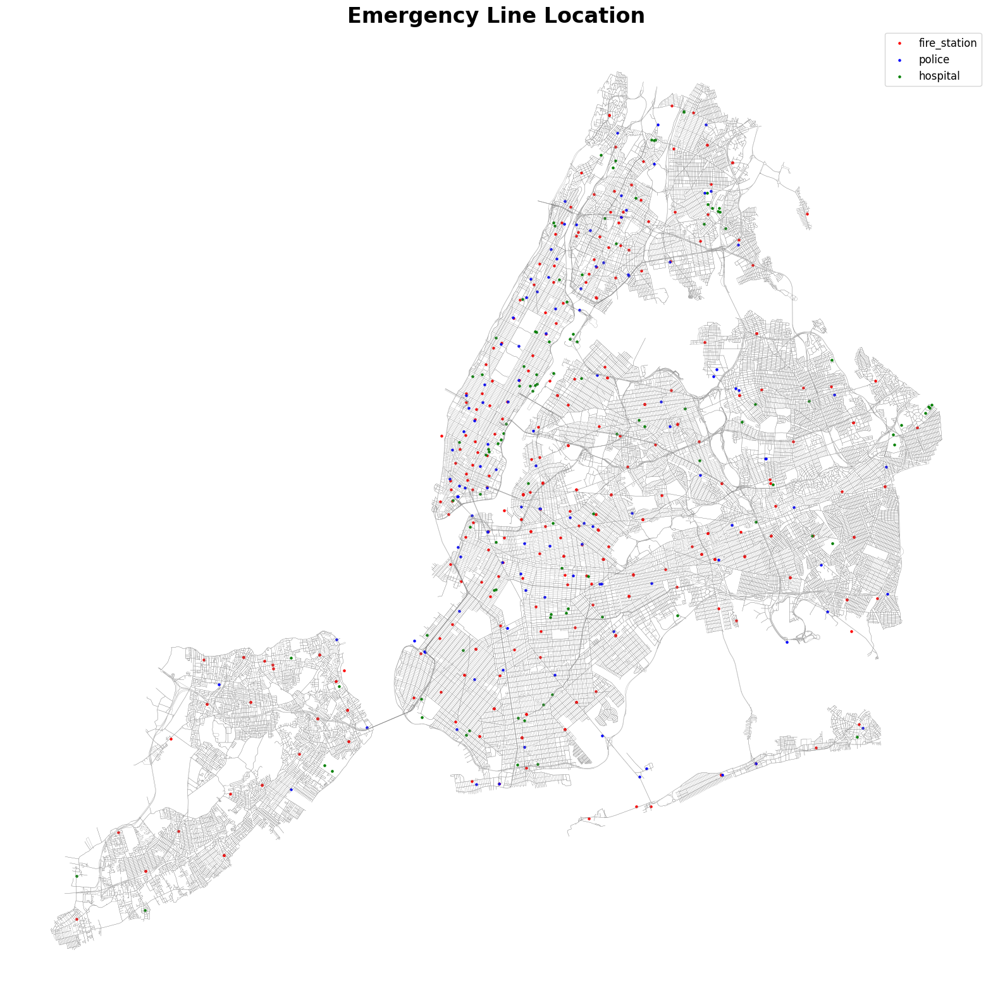

In [241]:
#Project the points to a projected coordinate system
ngdf_pts["geometry"]= ngdf_pts["geometry"].to_crs(pcs)

# Filter the POIs
filtered_gdf_fire_station = ngdf_pts[ngdf_pts['amenity'] == 'fire_station']
filtered_gdf_police = ngdf_pts[ngdf_pts['amenity'] == 'police']
filtered_gdf_hospital = ngdf_pts[ngdf_pts['amenity'] == 'hospital']

# Start plotting
fig, ax = plt.subplots(figsize=(20, 20))

# Plot filtered POIs
filtered_gdf_fire_station.plot(ax=ax, color='red', markersize=5, label='fire_station')
filtered_gdf_police.plot(ax=ax, color='blue', markersize=5, label='police')
filtered_gdf_hospital.plot(ax=ax, color='green', markersize=5, label='hospital')

# Plot the road network
edges.plot(ax=ax, linewidth=0.2, edgecolor='grey') # print edges
plt.title("Emergency Line Location", fontsize=24, fontweight='bold')
plt.axis('off')
plt.legend(fontsize='large') 
plt.show()

### Assign data to node/edges 

Assigning the types of Amenities to the nears nodes

In [242]:
# Create the refined dataset "E_buildings" with selected columns
columns = ['amenity', 'name', 'addr:city', 'addr:street', 'emergency','geometry']
E_buildings = ngdf_pts[columns]

# Display the Shape of the dataset 
print(E_buildings.shape)
E_buildings.head()

(525, 6)


amenity  \
element_type osmid                 
node         357571909  hospital   
             357607640  hospital   
             357607688  hospital   
             357611253  hospital   
             357616245  hospital   

                                                                     name  \
element_type osmid                                                          
node         357571909  Montefiore Medical Center West Campus Moses Di...   
             357607640       New York City Children's Center Bronx Campus   
             357607688                  Kirby Forensic Psychiatric Center   
             357611253                       North Central Bronx Hospital   
             357616245               George Rosenfeld Center for Recovery   

                           addr:city        addr:street emergency  \
element_type osmid                                                  
node         357571909         Bronx  East 210th Street       yes   
             357607640         Bronx       Waters Place        no   
             357607688  Wards Island  East 125th Street        no   
             357611253         Bronx     Kossuth Avenue       yes   
             357616245      New York   Hell Gate Circle        no   

                                          geometry  
element_type osmid                                  
node         357571909  POINT (-73.87984 40.88009)  
             357607640  POINT (-73.83883 40.84647)  
             357607688  POINT (-73.93226 40.78653)  
             357611253  POINT (-73.88140 40.88036)  
             357616245  POINT (-73.92791 40.78515)

In [243]:
#Centroid of the buildings
E_buildings_points=E_buildings["geometry"].centroid

C:\Users\pingn\AppData\Local\Temp\ipykernel_9840\1226050997.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  E_buildings_points=E_buildings["geometry"].centroid


In [244]:
#Convert the graph nodes to shapely points
Points_from_Nodes = gpd.GeoSeries(gpd.points_from_xy(list(nodes['x']),list(nodes['y'])))
print(Points_from_Nodes)

0        POINT (-73.79463 40.78641)
1        POINT (-73.79193 40.78716)
2        POINT (-73.78642 40.78930)
3        POINT (-73.75709 40.76243)
4        POINT (-73.75673 40.76237)
                    ...            
55327    POINT (-73.75864 40.67308)
55328    POINT (-73.72766 40.73110)
55329    POINT (-73.72722 40.73108)
55330    POINT (-73.91966 40.79554)
55331    POINT (-73.97411 40.74625)
Length: 55332, dtype: geometry


In [245]:
#Create a dictionary where {key:value} = {Point spatialIndex : Node osmid}
nodes_osmid=list(nodes.index)                      #list of nodes indicies in osmnx graph
Points_spatialindex=list(Points_from_Nodes.index)  #list of  spatial indicies of the created points

osmId_spatialIndex={}
[osmId_spatialIndex.update({i:j}) for i,j in zip(Points_spatialindex ,nodes_osmid)]
len(nodes_osmid)

55332

In [246]:
nearest_points_spatial_index_to_E_building= Points_from_Nodes.sindex.nearest(E_buildings_points , return_all=False ,return_distance=False)
nearest_points_spatial_index_to_E_building= nearest_points_spatial_index_to_E_building[1].tolist()
print(f'graph nodes spatial index{nearest_points_spatial_index_to_E_building}')
len(nearest_points_spatial_index_to_E_building)


graph nodes spatial index[21392, 54389, 53980, 20881, 52655, 53648, 1136, 673, 3977, 1724, 1350, 28555, 16570, 50713, 20147, 15466, 15466, 42821, 44062, 45991, 42713, 45364, 46429, 46429, 48891, 48891, 47589, 47199, 47199, 45364, 42713, 44323, 44323, 45839, 45839, 44062, 45991, 43136, 41642, 17964, 17964, 21649, 16849, 16570, 15406, 36072, 33019, 32810, 33494, 30923, 22714, 22409, 33695, 29162, 29708, 27788, 30563, 4757, 5982, 14348, 12760, 52452, 22657, 22657, 8639, 12475, 8946, 4372, 12627, 7809, 13053, 11304, 14220, 9816, 6736, 12243, 9475, 4194, 55204, 54037, 36086, 39594, 27788, 30371, 39206, 29162, 24206, 24048, 28359, 41252, 35842, 33494, 23021, 22409, 30923, 33695, 29922, 40562, 29708, 22714, 30563, 23021, 30179, 39964, 50909, 37151, 36086, 36072, 28359, 24048, 54037, 30371, 39594, 36229, 25904, 31551, 36229, 87, 3348, 3017, 898, 1496, 3465, 11937, 7724, 13391, 10141, 9774, 14064, 10475, 6064, 13926, 14348, 10475, 12760, 9774, 14220, 13548, 5982, 13391, 4757, 7724, 4155, 12627,

525

In [247]:
#Relate back to osmid
nearest_graph_nodes_01=[osmId_spatialIndex[i] for i in nearest_points_spatial_index_to_E_building]
len(nearest_graph_nodes_01) #same number of the polygons centroids

525

In [248]:
E_buildings['amenity']
list(E_buildings.amenity.unique()) 

['hospital', 'fire_station', 'police']

In [249]:
Proccessed_E_buildings=[]
for i in E_buildings['amenity']:
    if i=='fire_station':
        Proccessed_E_buildings.append('NY-FD')
    elif i=='police':
        Proccessed_E_buildings.append('NY-PD')
    elif i=='hospital':
        Proccessed_E_buildings.append('EMS')

E_buildings['emergency_type']=Proccessed_E_buildings
unique_emergency=list(E_buildings.emergency_type.unique())
unique_emergency

C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\geopandas\geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


['EMS', 'NY-FD', 'NY-PD']

In [250]:
all_nodes=list(G.nodes)
len(all_nodes)

55332

In [251]:
print(f' number of nodes selected by this dataset is {len(nearest_graph_nodes_01)}')
print(f' number of unique nodes selected by this dataset is {len(Counter(nearest_graph_nodes_01)) }')

 number of nodes selected by this dataset is 525
 number of unique nodes selected by this dataset is 447


In [252]:
nodes_attributes_01= {}

for i,j in zip(nearest_graph_nodes_01, E_buildings['emergency_type']):
      
      if i not in nodes_attributes_01.keys():
        nodes_attributes_01[i] = [0,0,0]     #initialize a list of four items for the categories

        for k,z in enumerate(unique_emergency):
          if j == z:
            nodes_attributes_01[i][k]=1   #try z instead of 1 to check the index 1 is placed in is correct

#check the dict structure
print(len(nodes_attributes_01))

{i: nodes_attributes_01[i] for i in list(nodes_attributes_01)}

447


{42756049: [1, 0, 0],
 4639095748: [1, 0, 0],
 3037017931: [1, 0, 0],
 42750225: [1, 0, 0],
 740060236: [1, 0, 0],
 2545719718: [1, 0, 0],
 42439073: [1, 0, 0],
 42428013: [1, 0, 0],
 371188320: [1, 0, 0],
 42440737: [1, 0, 0],
 42431656: [1, 0, 0],
 277767242: [1, 0, 0],
 42750031: [0, 1, 0],
 1579630833: [0, 1, 0],
 42745350: [0, 1, 0],
 42737719: [0, 1, 0],
 42949392: [0, 1, 0],
 5609962110: [0, 1, 0],
 42966437: [0, 1, 0],
 42971559: [0, 1, 0],
 42959377: [0, 1, 0],
 42964552: [0, 1, 0],
 42986987: [0, 1, 0],
 42972533: [0, 1, 0],
 42968991: [0, 1, 0],
 42970379: [0, 1, 0],
 42990248: [0, 1, 0],
 42950558: [0, 1, 0],
 42964675: [0, 1, 0],
 42769660: [0, 1, 0],
 1579630668: [0, 1, 0],
 42731755: [0, 1, 0],
 42718689: [0, 1, 0],
 42890024: [0, 1, 0],
 274301551: [0, 1, 0],
 42874754: [0, 1, 0],
 42837808: [0, 1, 0],
 42823778: [0, 1, 0],
 42836703: [0, 1, 0],
 277787655: [0, 1, 0],
 7762112549: [0, 1, 0],
 42817949: [0, 1, 0],
 42843612: [0, 1, 0],
 42918782: [0, 1, 0],
 42822333: [0

In [253]:
#now add to this dictionary the other unselected nodes with value = [0,0,0]
unsellected_nodes_01= np.setdiff1d(all_nodes,nearest_graph_nodes_01) #check the nodes that exist in all_nodes but not in the nearest_graph_nodes
unsellected_nodes_01=unsellected_nodes_01.tolist()
[nodes_attributes_01.update({i: [0,0,0]}) for i in unsellected_nodes_01]
print(len(unsellected_nodes_01))
print(len(nodes_attributes_01))      #has to be the same number of graph nodes


54885
55332


## Feature 2  - Crime Locations

### Description
All valid felony, misdemeanor, and violation crimes reported to the New York City Police Department (NYPD). 

URL = https://data.cityofnewyork.us/Public-Safety/NYPD-Complaint-Data-Current-Year-To-Date-/5uac-w243/about_data

### Load the dataset

In [254]:
url="https://raw.githubusercontent.com/NaveenKumar-ar/GraphML_Repo/main/02-Datasets/Crime%20data/NYPD_Complaint_Data_Current__Year_To_Date__20240522.csv"
crime_df = pd.read_csv(url)
print(crime_df.head())

  CMPLNT_NUM  ADDR_PCT_CD    BORO_NM CMPLNT_FR_DT CMPLNT_FR_TM CMPLNT_TO_DT  \
0  282536052           79   BROOKLYN   02/15/2024     07:20:00          NaN   
1  282805297           42      BRONX   02/25/2024     12:24:00          NaN   
2  280611665          105     QUEENS   01/16/2024     08:00:00   01/16/2024   
3  284354345           68   BROOKLYN   03/25/2024     11:16:00   03/25/2024   
4  282082987           17  MANHATTAN   02/12/2024     12:35:00   02/12/2024   

  CMPLNT_TO_TM CRM_ATPT_CPTD_CD HADEVELOPT  HOUSING_PSA  ...  \
0       (null)        COMPLETED     (null)          NaN  ...   
1       (null)        COMPLETED     (null)          NaN  ...   
2     08:10:00        COMPLETED     (null)          NaN  ...   
3     16:00:00        COMPLETED     (null)          NaN  ...   
4     12:40:00        COMPLETED     (null)          NaN  ...   

   TRANSIT_DISTRICT VIC_AGE_GROUP                  VIC_RACE VIC_SEX  \
0               NaN           <18                   UNKNOWN       F  

C:\Users\pingn\AppData\Local\Temp\ipykernel_9840\565868351.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  crime_df = pd.read_csv(url)


In [262]:
#fitering points only
crime_gdf_points = crime_gdf[crime_gdf['geometry'].type == 'Point']
crashes_gdf = crime_gdf.dropna(subset=['geometry'])
crime_gdf_points.head()

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,HOUSING_PSA,...,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column,geometry
0,282536052,79,BROOKLYN,02/15/2024,07:20:00,NaN,(null),COMPLETED,(null),NaN,...,<18,UNKNOWN,F,999496.0,190300.0,40.689001,-73.945027,"(40.68900139556, -73.9450265328727)",POINT (-73.9450265328727 40.68900139556),POINT (-73.94503 40.68900)
1,282805297,42,BRONX,02/25/2024,12:24:00,NaN,(null),COMPLETED,(null),NaN,...,45-64,BLACK,M,1013401.0,241248.0,40.828800,-73.894664,"(40.8288, -73.894664)",POINT (-73.894664 40.8288),POINT (-73.89466 40.82880)
2,280611665,105,QUEENS,01/16/2024,08:00:00,01/16/2024,08:10:00,COMPLETED,(null),NaN,...,65+,WHITE,M,1062950.0,205790.0,40.731173,-73.716036,"(40.731173, -73.716036)",POINT (-73.716036 40.731173),POINT (-73.71604 40.73117)
3,284354345,68,BROOKLYN,03/25/2024,11:16:00,03/25/2024,16:00:00,COMPLETED,(null),NaN,...,45-64,ASIAN / PACIFIC ISLANDER,M,980639.0,170223.0,40.633899,-74.013008,"(40.633899, -74.013008)",POINT (-74.013008 40.633899),POINT (-74.01301 40.63390)
4,282082987,17,MANHATTAN,02/12/2024,12:35:00,02/12/2024,12:40:00,COMPLETED,(null),NaN,...,UNKNOWN,UNKNOWN,D,992155.0,213560.0,40.752848,-73.971465,"(40.752848, -73.971465)",POINT (-73.971465 40.752848),POINT (-73.97146 40.75285)


In [256]:
#check for duplicates
print(crime_gdf_points.duplicated(subset=['geometry']).sum())

# Check the number of point and polygon geometries
point_count = len(crime_gdf_points[crime_gdf_points.geometry.geom_type == 'Point'])
polygon_count = len(crime_gdf_points[crime_gdf_points.geometry.geom_type == 'Polygon'])

print("Number of point geometries:", point_count)
print("Number of polygon geometries:", polygon_count)

96673
Number of point geometries: 137268
Number of polygon geometries: 0


### Plot dataset

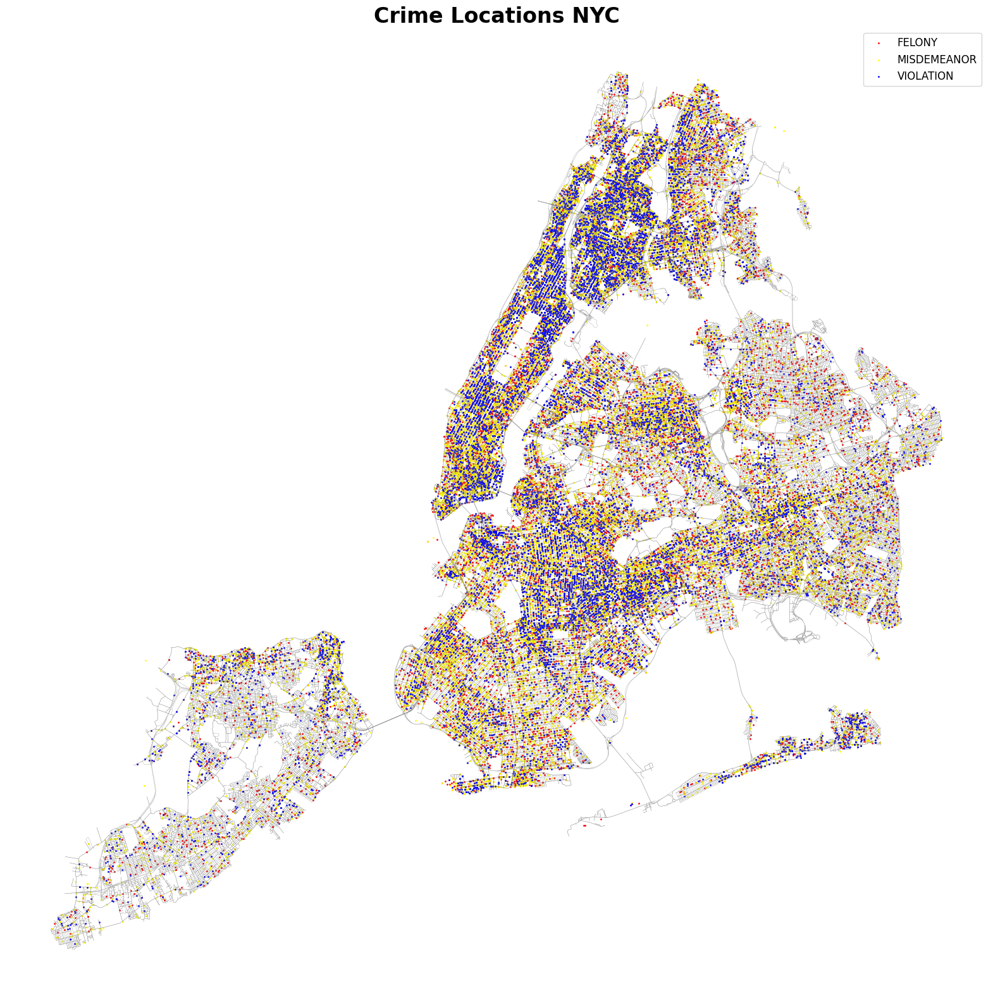

In [257]:
#Project the points to a projected coordinate system
crime_gdf_points["geometry"]= crime_gdf_points["geometry"].to_crs(pcs)

#classifying the crime types
crime_felony = crime_gdf_points[crime_gdf_points['LAW_CAT_CD'] == 'FELONY']
crime_misdemeanor = crime_gdf_points[crime_gdf_points['LAW_CAT_CD'] == 'MISDEMEANOR']
crime_violation = crime_gdf_points[crime_gdf_points['LAW_CAT_CD'] == 'VIOLATION']

# Start plotting
fig, ax = plt.subplots(figsize=(20, 20))

# Plot filtered POIs
crime_felony.plot(ax=ax, color='red', markersize=1, label='FELONY')
crime_misdemeanor.plot(ax=ax, color='yellow', markersize=1, label='MISDEMEANOR')
crime_violation.plot(ax=ax, color='blue', markersize=1, label='VIOLATION')

edges.plot(ax=ax, linewidth=0.2, edgecolor='grey') # print edges
plt.title("Crime Locations NYC",  fontsize=24, fontweight='bold')
plt.axis('off')
plt.legend(fontsize='large')
plt.show()

### 01

In [25]:
crime_gdf_points = crime_gdf_points[~crime_gdf_points['geometry'].is_empty]
crime_gdf_points = crime_gdf_points[~crime_gdf_points['geometry'].apply(lambda geom: pd.isnull(geom.x) or pd.isnull(geom.y))]
crime_gdf_points.head()

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,JURIS_DESC,KY_CD,...,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column,geometry
0,282536052,79,BROOKLYN,02/15/2024,7:20:00,NaN,(null),COMPLETED,N.Y. POLICE DEPT,104,...,<18,UNKNOWN,F,999496.0,190300.0,40.689001,-73.945027,"(40.68900139556, -73.9450265328727)",POINT (-73.9450265328727 40.68900139556),POINT (-73.94503 40.68900)
1,282805297,42,BRONX,02/25/2024,12:24:00,NaN,(null),COMPLETED,N.Y. POLICE DEPT,578,...,45-64,BLACK,M,1013401.0,241248.0,40.828800,-73.894664,"(40.8288, -73.894664)",POINT (-73.894664 40.8288),POINT (-73.89466 40.82880)
2,280611665,105,QUEENS,01/16/2024,8:00:00,01/16/2024,8:10:00,COMPLETED,N.Y. POLICE DEPT,578,...,65+,WHITE,M,1062950.0,205790.0,40.731173,-73.716036,"(40.731173, -73.716036)",POINT (-73.716036 40.731173),POINT (-73.71604 40.73117)
3,284354345,68,BROOKLYN,03/25/2024,11:16:00,03/25/2024,16:00:00,COMPLETED,N.Y. POLICE DEPT,351,...,45-64,ASIAN / PACIFIC ISLANDER,M,980639.0,170223.0,40.633899,-74.013008,"(40.633899, -74.013008)",POINT (-74.013008 40.633899),POINT (-74.01301 40.63390)
4,282082987,17,MANHATTAN,02-12-2024,12:35:00,02-12-2024,12:40:00,COMPLETED,N.Y. POLICE DEPT,341,...,UNKNOWN,UNKNOWN,D,992155.0,213560.0,40.752848,-73.971465,"(40.752848, -73.971465)",POINT (-73.971465 40.752848),POINT (-73.97146 40.75285)


In [26]:
# Create a dictionary to map 'LAW_CAT_CD' values to 'crime' values
crime_map = {'FELONY': 1, 'MISDEMEANOR': 2, 'VIOLATION': 3}

# Add a new column 'crime' based on 'LAW_CAT_CD'
crime_gdf['crimes'] = crime_gdf['LAW_CAT_CD'].map(crime_map)

# Display the first few rows to verify
print(crime_gdf.head())

  CMPLNT_NUM  ADDR_PCT_CD    BORO_NM CMPLNT_FR_DT CMPLNT_FR_TM CMPLNT_TO_DT  \
0  282536052           79   BROOKLYN   02/15/2024      7:20:00          NaN   
1  282805297           42      BRONX   02/25/2024     12:24:00          NaN   
2  280611665          105     QUEENS   01/16/2024      8:00:00   01/16/2024   
3  284354345           68   BROOKLYN   03/25/2024     11:16:00   03/25/2024   
4  282082987           17  MANHATTAN   02-12-2024     12:35:00   02-12-2024   

  CMPLNT_TO_TM CRM_ATPT_CPTD_CD HADEVELOPT        JURIS_DESC  ...  \
0       (null)        COMPLETED     (null)  N.Y. POLICE DEPT  ...   
1       (null)        COMPLETED     (null)  N.Y. POLICE DEPT  ...   
2      8:10:00        COMPLETED     (null)  N.Y. POLICE DEPT  ...   
3     16:00:00        COMPLETED     (null)  N.Y. POLICE DEPT  ...   
4     12:40:00        COMPLETED     (null)  N.Y. POLICE DEPT  ...   

                   VIC_RACE VIC_SEX X_COORD_CD Y_COORD_CD   Latitude  \
0                   UNKNOWN       F   

In [27]:
close_edges = ox.distance.nearest_edges(G, crime_gdf_points['geometry'].x, crime_gdf_points['geometry'].y)
crime_count = Counter(close_edges)

In [28]:
crimes = []

for i in edges.index:
    # Retrieve the number of crashes for the edge at position i
    crime = crime_count[edges.loc[i].name]
    crimes.append(crime)

max_crashes = max(crimes)
edges['crimes'] = crimes

In [29]:
log_weights = np.log(edges['crimes']+1)
normalized_crimes = (log_weights - log_weights.min()) / (log_weights.max() - log_weights.min())

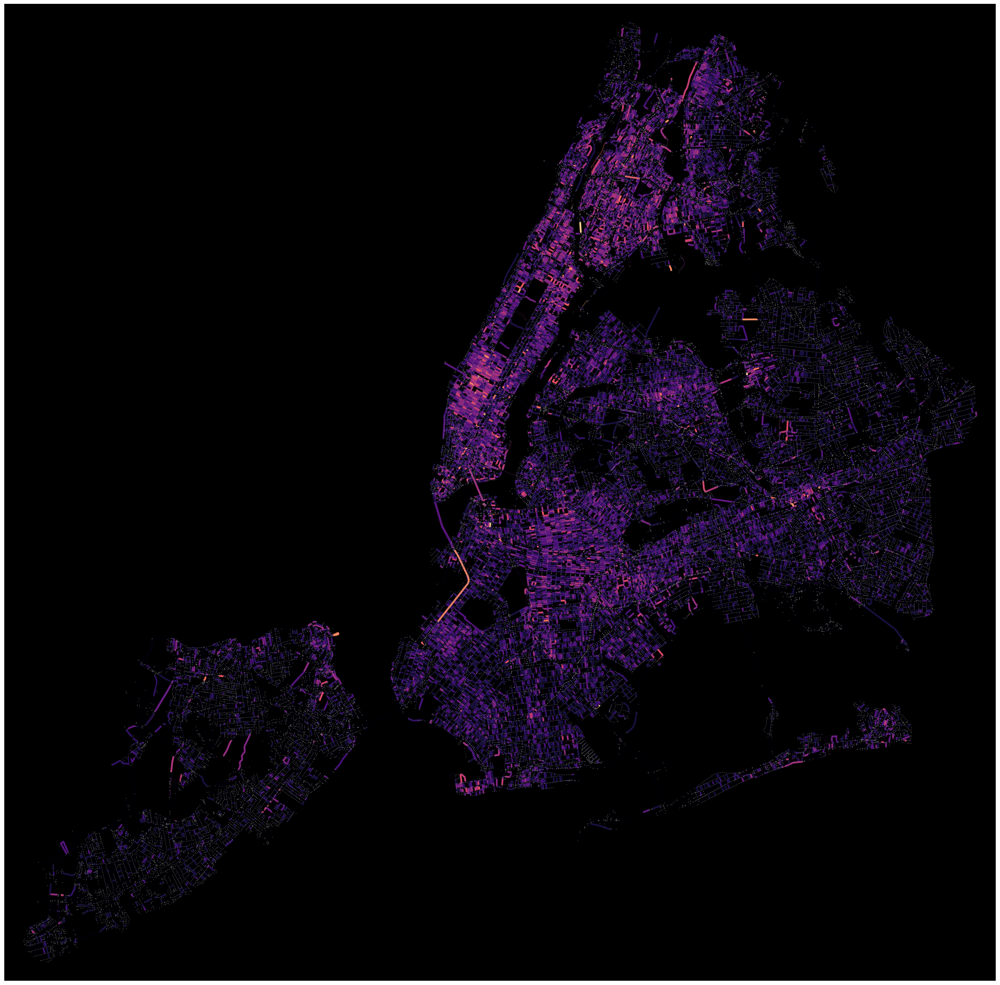

In [30]:
edges['normalized crime'] = normalized_crimes

G = ox.graph_from_gdfs(nodes, edges)
ec = ox.plot.get_edge_colors_by_attr(G, attr = 'normalized crime', cmap= 'magma')

fig, ax = ox.plot_graph(G, node_size=1, node_color = 'grey', edge_color=ec, edge_linewidth=3, figsize=(30,30), edge_alpha=1, bgcolor='black')

## Feature 3 - Vehicular Crashes

### Descrpition
Serious vehicular crashes that were analyzed and reported on as part of SIRTA.

URL = https://data.cityofnewyork.us/Transportation/Serious-Injury-Response-Tracking-Analysis-Program-/xeqp-qz8h/about_data

### Load the dataset

In [259]:
url ="https://raw.githubusercontent.com/ManolyaLN/GraphML_Repo/Manolya/02-Datasets/Serious_Injury_Response__Tracking___Analysis_Program__SIRTA__20240521.csv"
vehicular_crashes = pd.read_csv(url)
print(vehicular_crashes.head())

   Collision ID  Crash Date Crash Time  Crash Police Precinct Crash Borough  \
0     4492364.0  01/01/2022      01:28                   46.0         Bronx   
1     4491159.0  01/01/2022      04:33                   46.0         Bronx   
2     4491487.0  01/01/2022      05:55                   47.0         Bronx   
3     4491223.0  01/01/2022      10:42                   43.0         Bronx   
4     4491418.0  01/01/2022      20:55                   49.0         Bronx   

   Total Non-Severe Injuries  Total Severe Injuries  Total Fatalities  \
0                        1.0                    1.0               0.0   
1                        0.0                    1.0               0.0   
2                        0.0                    1.0               0.0   
3                        0.0                    1.0               0.0   
4                        0.0                    1.0               0.0   

    Latitude  Longitude  ... Highway Reference Marker ZipCode  \
0  40.858707  -73.903

In [267]:
# Create a GeoDataFrame from the vehicular crashes DataFrame
geometry = gpd.points_from_xy(vehicular_crashes['Longitude'], vehicular_crashes['Latitude'])
crashes_gdf = gpd.GeoDataFrame(vehicular_crashes, geometry=geometry)
crashes_gdf.set_crs(epsg=4326, inplace=True)

,Collision ID,Crash Date,Crash Time,Crash Police Precinct,Crash Borough,Total Non-Severe Injuries,Total Severe Injuries,Total Fatalities,Latitude,Longitude,...,ZipCode,Similar Fatalities & Severe Injuries (3Y Lookback),Similar Fatalities & All Injuries (3Y Lookback),Community Board,Council District,Building Identification Number (BIN),Borough Block Lot (BBL),Census Tract (2020),Neighborhood Tabulation Area (NTA) (2020),geometry
0,4492364.0,01/01/2022,01:28,46.0,Bronx,1.0,1.0,0.0,40.858707,-73.90370,...,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.90370 40.85871)
1,4491159.0,01/01/2022,04:33,46.0,Bronx,0.0,1.0,0.0,NaN,NaN,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT EMPTY
2,4491487.0,01/01/2022,05:55,47.0,Bronx,0.0,1.0,0.0,40.871550,-73.86428,...,NaN,0.0,0.0,212.0,12.0,2056281.0,2.045980e+09,372.0,BX1201,POINT (-73.86428 40.87155)
3,4491223.0,01/01/2022,10:42,43.0,Bronx,0.0,1.0,0.0,40.823673,-73.87233,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.87233 40.82367)
4,4491418.0,01/01/2022,20:55,49.0,Bronx,0.0,1.0,0.0,40.863945,-73.86452,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.86452 40.86395)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5568,4670978.0,09/29/2023,00:02,45.0,Bronx,0.0,1.0,0.0,40.838345,-73.84650,...,10461.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.84650 40.83834)
5569,4671179.0,09/16/2023,14:08,40.0,Bronx,0.0,1.0,0.0,40.804585,-73.91213,...,NaN,0.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.91213 40.80459)
5570,4671610.0,09/29/2023,07:46,44.0,Bronx,0.0,1.0,0.0,40.839222,-73.91510,...,10452.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.91510 40.83922)
5571,4672556.0,09/11/2023,19:00,42.0,Bronx,0.0,1.0,0.0,40.822575,-73.90321,...,10456.0,0.0,2.0,203.0,17.0,2091959.0,2.026380e+09,133.0,BX0301,POINT (-73.90321 40.82258)


In [268]:
#fitering points only
crashes_gdf_points = crashes_gdf[crashes_gdf['geometry'].type == 'Point']
crashes_gdf = crashes_gdf.dropna(subset=['geometry'])
crashes_gdf_points.head()

,Collision ID,Crash Date,Crash Time,Crash Police Precinct,Crash Borough,Total Non-Severe Injuries,Total Severe Injuries,Total Fatalities,Latitude,Longitude,...,ZipCode,Similar Fatalities & Severe Injuries (3Y Lookback),Similar Fatalities & All Injuries (3Y Lookback),Community Board,Council District,Building Identification Number (BIN),Borough Block Lot (BBL),Census Tract (2020),Neighborhood Tabulation Area (NTA) (2020),geometry
0,4492364.0,01/01/2022,01:28,46.0,Bronx,1.0,1.0,0.0,40.858707,-73.90370,...,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.90370 40.85871)
1,4491159.0,01/01/2022,04:33,46.0,Bronx,0.0,1.0,0.0,NaN,NaN,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT EMPTY
2,4491487.0,01/01/2022,05:55,47.0,Bronx,0.0,1.0,0.0,40.871550,-73.86428,...,NaN,0.0,0.0,212.0,12.0,2056281.0,2.045980e+09,372.0,BX1201,POINT (-73.86428 40.87155)
3,4491223.0,01/01/2022,10:42,43.0,Bronx,0.0,1.0,0.0,40.823673,-73.87233,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.87233 40.82367)
4,4491418.0,01/01/2022,20:55,49.0,Bronx,0.0,1.0,0.0,40.863945,-73.86452,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.86452 40.86395)


In [269]:
#check for duplicates
print(crashes_gdf_points.duplicated(subset=['geometry']).sum())

# Check the number of point and polygon geometries
point_count = len(crashes_gdf_points[crashes_gdf_points.geometry.geom_type == 'Point'])
polygon_count = len(crashes_gdf_points[crashes_gdf_points.geometry.geom_type == 'Polygon'])

print("Number of point geometries:", point_count)
print("Number of polygon geometries:", polygon_count)

1647
Number of point geometries: 5573
Number of polygon geometries: 0


### Plot dataset

C:\Users\pingn\AppData\Local\Temp\ipykernel_9840\3445717994.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize='large')


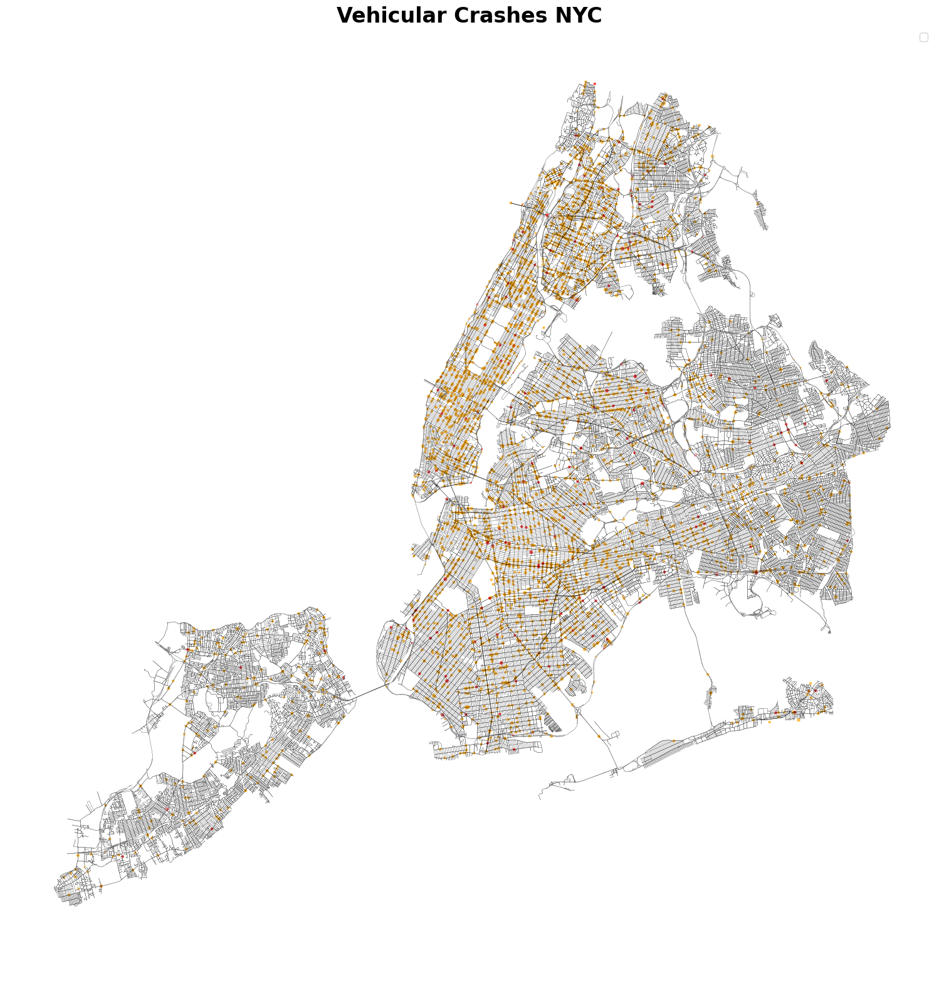

In [272]:

# Define marker sizes and colors based on severity
def marker_size(row):
    if row['Total Fatalities'] > 0:
        return 10
    elif row['Total Severe Injuries'] > 0:
        return 5
    else:
        return 3

def marker_color(row):
    if row['Total Fatalities'] > 0:
        return 'red'
    elif row['Total Severe Injuries'] > 0:
        return 'orange'
    else:
        return 'green'

# Apply the functions to create new columns in the GeoDataFrame
crashes_gdf['marker_size'] = crashes_gdf.apply(marker_size, axis=1)
crashes_gdf['marker_color'] = crashes_gdf.apply(marker_color, axis=1)

# Plot the data
fig, ax = plt.subplots(figsize=(20, 20))
area.plot(ax=ax, facecolor='white')
edges.plot(ax=ax, linewidth=0.2, edgecolor='black', facecolor='white')

# Plot crashes with varying sizes and colors
crashes_gdf.plot(ax=ax, markersize=crashes_gdf['marker_size'], color=crashes_gdf['marker_color'], alpha=0.6)
plt.title("Vehicular Crashes NYC", fontsize=24, fontweight='bold')
plt.axis('off')
plt.legend(fontsize='large')
plt.show()


### 03

In [37]:
crashes_gdf = crashes_gdf[~crashes_gdf['geometry'].is_empty]
crashes_gdf = crashes_gdf[~crashes_gdf['geometry'].apply(lambda geom: pd.isnull(geom.x) or pd.isnull(geom.y))]
crashes_gdf.head()

,Collision ID,Crash Date,Crash Time,Crash Police Precinct,Crash Borough,Total Non-Severe Injuries,Total Severe Injuries,Total Fatalities,Latitude,Longitude,...,ZipCode,Similar Fatalities & Severe Injuries (3Y Lookback),Similar Fatalities & All Injuries (3Y Lookback),Community Board,Council District,Building Identification Number (BIN),Borough Block Lot (BBL),Census Tract (2020),Neighborhood Tabulation Area (NTA) (2020),geometry
0,4492364.0,01/01/2022,01:28,46.0,Bronx,1.0,1.0,0.0,40.858707,-73.90370,...,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.90370 40.85871)
2,4491487.0,01/01/2022,05:55,47.0,Bronx,0.0,1.0,0.0,40.871550,-73.86428,...,NaN,0.0,0.0,212.0,12.0,2056281.0,2.045980e+09,372.0,BX1201,POINT (-73.86428 40.87155)
3,4491223.0,01/01/2022,10:42,43.0,Bronx,0.0,1.0,0.0,40.823673,-73.87233,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.87233 40.82367)
4,4491418.0,01/01/2022,20:55,49.0,Bronx,0.0,1.0,0.0,40.863945,-73.86452,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.86452 40.86395)
6,4491529.0,01/02/2022,01:22,52.0,Bronx,0.0,0.0,1.0,40.882217,-73.88046,...,NaN,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.88046 40.88222)


In [38]:
close_edges = ox.distance.nearest_edges(G, crashes_gdf['geometry'].x, crashes_gdf['geometry'].y)
crash_count = Counter(close_edges)

In [39]:
crashes = []

for i in edges.index:
    # Retrieve the number of crashes for the edge at position i
    crash = crash_count[edges.loc[i].name]
    crashes.append(crash)

max_crashes = max(crashes)
edges['crashes'] = crashes

In [40]:
log_weights = np.log(edges['crashes']+1)
normalized_crashes = (log_weights - log_weights.min()) / (log_weights.max() - log_weights.min())

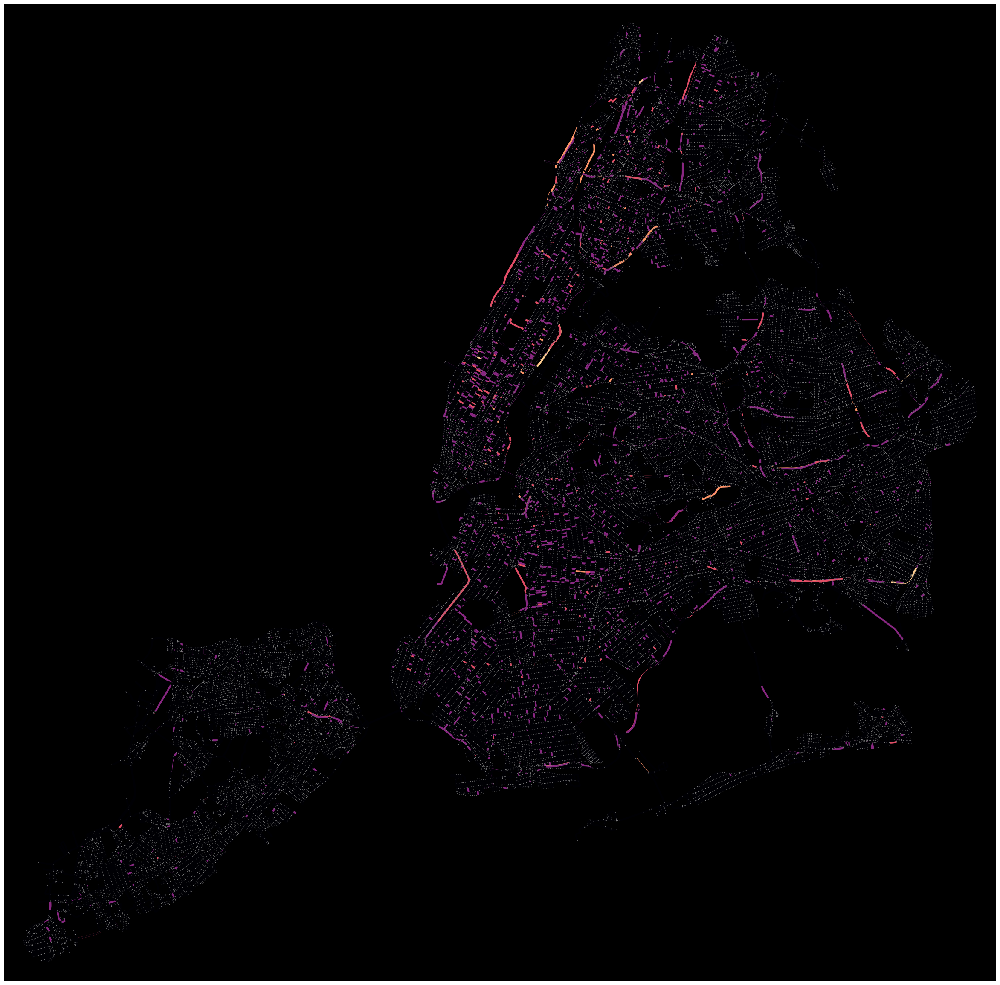

In [41]:
edges['normalized crashes'] = normalized_crashes

G = ox.graph_from_gdfs(nodes, edges)
ec = ox.plot.get_edge_colors_by_attr(G, attr = 'normalized crashes', cmap= 'magma')

fig, ax = ox.plot_graph(G, node_size=1, node_color = 'grey', edge_color=ec, edge_linewidth=3, figsize=(30,30), edge_alpha=1, bgcolor='black')

## Feature 4 - Fire Incidents

https://data.cityofnewyork.us/Public-Safety/Fire-Incident-Dispatch-Data/8m42-w767/about_data

The Fire Incident Dispatch Data file contains data that is generated by the Starfire Computer Aided Dispatch System. The data spans from the time the incident is created in the system to the time the incident is closed in the system. It covers information about the incident as it relates to the assignment of resources and the Fire Department’s response to the emergency.

https://data.cityofnewyork.us/Public-Safety/Emergency-Response-Incidents/pasr-j7fb/about_data

In [42]:
emergency_response = pd.read_csv("https://raw.githubusercontent.com/hetal-bharwani/graphML/main/Emergency_Response_Incidents_20240522.csv")

In [43]:
fire_incidents = emergency_response[emergency_response['Incident Type'].str.contains("fire", case=False, na=False)]

In [44]:
geometry = gpd.points_from_xy(fire_incidents['Longitude'], fire_incidents['Latitude'])
fire_gdf = gpd.GeoDataFrame(fire_incidents, geometry=geometry)
fire_gdf.set_crs(epsg=4326, inplace=True)

,Incident Type,Location,Borough,Creation Date,Closed Date,Latitude,Longitude,geometry
6,Fire-2nd Alarm,238 East 24 Street,Manhattan,11/25/2016 04:06:09 AM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)
8,Fire-10-76 (Commercial High Rise Fire),130 East 57 Street,Manhattan,11/26/2016 05:45:43 AM,NaN,NaN,NaN,POINT EMPTY
10,Fire-2nd Alarm,24 Charles Street,Manhattan,12/14/2016 10:26:17 PM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)
11,Fire-3rd Alarm,581 3 ave,new york,11/30/2016 12:25:38 AM,11/30/2016 04:22:22 AM,40.667490,-73.994286,POINT (-73.99429 40.66749)
14,Fire-2nd Alarm,53-09 Beach Channel Drive,Far Rockaway,12/18/2016 05:52:37 PM,NaN,40.595083,-73.784005,POINT (-73.78401 40.59508)
...,...,...,...,...,...,...,...,...
11738,Fire-Other,NaN,Brooklyn,09/03/2015 03:30:43 AM,09/03/2015 03:30:43 AM,NaN,NaN,POINT EMPTY
11740,Fire-2nd Alarm,NaN,Brooklyn,01/23/2016 01:34:29 AM,01/23/2016 04:20:06 AM,NaN,NaN,POINT EMPTY
11743,Fire-10-77 (Residential High Rise Fire),72 Columbia Street,Manhattan,11/07/2016 12:40:50 PM,11/07/2016 12:49:16 PM,NaN,NaN,POINT EMPTY
11745,Fire-1st Alarm,NaN,Brooklyn,11/07/2016 05:09:53 PM,11/07/2016 08:09:32 PM,NaN,NaN,POINT EMPTY


In [45]:
minx, miny, maxx, maxy = -74.259090, 40.477399, -73.700272, 40.917577  # Example for New York City
bbox = box(minx, miny, maxx, maxy)

# Filter out points outside the bounding box
fire_gdf = fire_gdf[fire_gdf['geometry'].within(bbox)]

In [46]:
# Check the CRS of your fire_gdf and the bounding box
print("CRS of fire_gdf:", fire_gdf.crs)
bbox_crs = {'init': 'epsg:4326'}  # WGS 84
print("CRS of bounding box:", bbox_crs)

CRS of fire_gdf: EPSG:4326
CRS of bounding box: {'init': 'epsg:4326'}


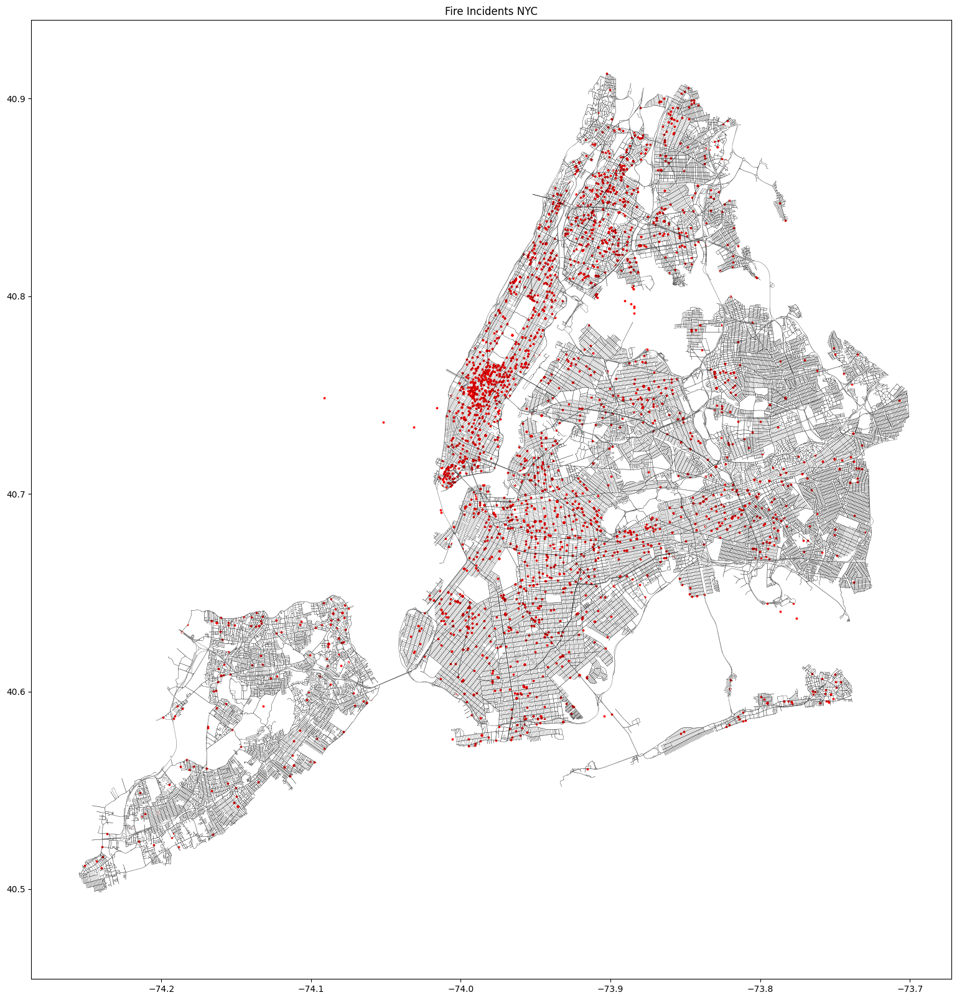

In [47]:
nodes, edges = ox.graph_to_gdfs(G)
fig, ax = plt.subplots(figsize=(20, 20))
area.plot(ax = ax, facecolor = 'white')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'black', facecolor = 'white')
nodes.plot(ax= ax, color = 'white', markersize = .1)
fire_gdf.plot(ax=ax, markersize=3, color='red')
plt.title("Fire Incidents NYC")
plt.show()

In [48]:
fire_gdf = fire_gdf[~fire_gdf['geometry'].is_empty]
fire_gdf = fire_gdf[~fire_gdf['geometry'].apply(lambda geom: pd.isnull(geom.x) or pd.isnull(geom.y))]
fire_gdf.head()

,Incident Type,Location,Borough,Creation Date,Closed Date,Latitude,Longitude,geometry
6,Fire-2nd Alarm,238 East 24 Street,Manhattan,11/25/2016 04:06:09 AM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)
10,Fire-2nd Alarm,24 Charles Street,Manhattan,12/14/2016 10:26:17 PM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)
11,Fire-3rd Alarm,581 3 ave,new york,11/30/2016 12:25:38 AM,11/30/2016 04:22:22 AM,40.667490,-73.994286,POINT (-73.99429 40.66749)
14,Fire-2nd Alarm,53-09 Beach Channel Drive,Far Rockaway,12/18/2016 05:52:37 PM,NaN,40.595083,-73.784005,POINT (-73.78401 40.59508)
15,Fire-1st Alarm,151 West 100 Street,Manhattan,12/23/2016 01:36:49 PM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)


In [49]:
print(len(fire_gdf))

3764


## Feature 5 - Traffic

https://www.dot.ny.gov/tdv

Annual Average Daily Traffic (AADT) and additional traffic statistics for a Traffic Station. The Route Network layer provides a visual representation of Traffic Station segments. The Traffic Station location points provide details for individual counts at the specific location of data collection.

- Vehicle volume, classification, and speed data
- Annual Average Daily Traffic (AADT)
- Truck AADT and Truck Percentage
- Location of historical short count sites

https://data.cityofnewyork.us/Transportation/Traffic-Volume-Counts/btm5-ppia/about_data

https://data.cityofnewyork.us/City-Government/LION/2v4z-66xt/about_data

New York City Department of Transportation (NYC DOT) uses Automated Traffic Recorders (ATR) to collect traffic sample volume counts at bridge crossings and roadways.

In [50]:
#from google.colab import drive
#drive.mount('/content/drive')

In [51]:
#gdb_path = '/content/drive/MyDrive/Colab Notebooks/AADT_2021.gdb'

In [52]:
pcs = "EPSG:2263"
G=ox.project_graph(G,to_crs=pcs)

In [53]:
nodes, edges = ox.graph_to_gdfs(G)

In [54]:
boundary = ox.geocode_to_gdf(place_name)
boundary=ox.projection.project_gdf(boundary, to_crs=pcs, to_latlong=False)

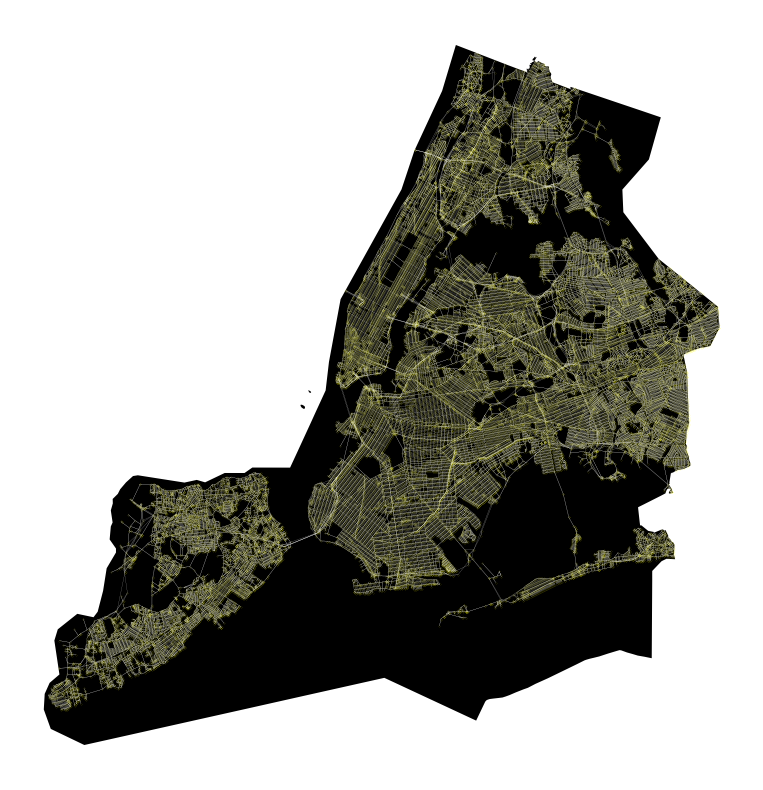

In [55]:
fig, ax = plt.subplots(figsize=(10,10))
boundary.plot(ax=ax, facecolor='black')
edges.plot(ax=ax, linewidth=0.1, edgecolor='black')
nodes.plot(ax=ax, color='yellow', markersize=0.003)
plt.axis("off")
plt.show()

In [152]:
import pandas as pd
from geopy.geocoders import Nominatim
from shapely.geometry import LineString


# URL to the raw CSV file on GitHub
url = 'https://raw.githubusercontent.com/NaveenKumar-ar/GraphML_Repo/main/02-Datasets/Geo-Traffic%20data/Traffic_Volume_Counts_20240515.csv'

# Load the dataset from GitHub
data = pd.read_csv(url)
# data = data.iloc[:100]

,ID,SegmentID,Roadway Name,From,To,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,...,2:00-3:00PM,3:00-4:00PM,4:00-5:00PM,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM
0,1,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-09-2012,20.0,10.0,11.0,...,104.0,105.0,147.0,120.0,91.0,83.0,74.0,49.0,42.0,42.0
1,2,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-10-2012,21.0,16.0,8.0,...,102.0,98.0,133.0,131.0,95.0,73.0,70.0,63.0,42.0,35.0
2,3,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-11-2012,27.0,14.0,6.0,...,115.0,115.0,130.0,143.0,106.0,89.0,68.0,64.0,56.0,43.0
3,4,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-12-2012,22.0,7.0,7.0,...,71.0,127.0,122.0,144.0,122.0,76.0,64.0,58.0,64.0,43.0
4,5,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01/13/2012,31.0,17.0,7.0,...,113.0,126.0,133.0,135.0,102.0,106.0,58.0,58.0,55.0,54.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42751,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/18/2020,68.0,63.0,31.0,...,152.0,177.0,162.0,164.0,183.0,173.0,143.0,113.0,127.0,133.0
42752,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/19/2020,71.0,59.0,42.0,...,166.0,162.0,187.0,182.0,180.0,190.0,162.0,155.0,234.0,166.0
42753,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/20/2020,111.0,79.0,54.0,...,157.0,186.0,170.0,158.0,194.0,196.0,222.0,174.0,182.0,178.0
42754,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/21/2020,129.0,95.0,63.0,...,139.0,147.0,153.0,183.0,163.0,184.0,183.0,169.0,187.0,211.0


In [153]:
morning_hours = ['5:00-6:00AM', '6:00-7:00AM', '7:00-8:00AM', '8:00-9:00AM', '9:00-10:00AM', '10:00-11:00AM', '11:00-12:00PM']
afternoon_hours = ['12:00-1:00PM', '1:00-2:00PM', '2:00-3:00PM', '3:00-4:00PM', '4:00-5:00PM']
evening_hours = ['5:00-6:00PM', '6:00-7:00PM', '7:00-8:00PM', '8:00-9:00PM', '9:00-10:00PM', '10:00-11:00PM', '11:00-12:00AM']

# Sum vehicle counts for each period
data['morning'] = data[morning_hours].sum(axis=1)
data['afternoon'] = data[afternoon_hours].sum(axis=1)
data['evening'] = data[evening_hours].sum(axis=1)

,ID,SegmentID,Roadway Name,From,To,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,...,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM,morning,afternoon,evening
0,1,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-09-2012,20.0,10.0,11.0,...,120.0,91.0,83.0,74.0,49.0,42.0,42.0,425.0,535.0,501.0
1,2,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-10-2012,21.0,16.0,8.0,...,131.0,95.0,73.0,70.0,63.0,42.0,35.0,350.0,501.0,509.0
2,3,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-11-2012,27.0,14.0,6.0,...,143.0,106.0,89.0,68.0,64.0,56.0,43.0,402.0,539.0,569.0
3,4,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-12-2012,22.0,7.0,7.0,...,144.0,122.0,76.0,64.0,58.0,64.0,43.0,405.0,528.0,571.0
4,5,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01/13/2012,31.0,17.0,7.0,...,135.0,102.0,106.0,58.0,58.0,55.0,54.0,445.0,573.0,568.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42751,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/18/2020,68.0,63.0,31.0,...,164.0,183.0,173.0,143.0,113.0,127.0,133.0,1145.0,787.0,1036.0
42752,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/19/2020,71.0,59.0,42.0,...,182.0,180.0,190.0,162.0,155.0,234.0,166.0,967.0,826.0,1269.0
42753,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/20/2020,111.0,79.0,54.0,...,158.0,194.0,196.0,222.0,174.0,182.0,178.0,948.0,845.0,1304.0
42754,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/21/2020,129.0,95.0,63.0,...,183.0,163.0,184.0,183.0,169.0,187.0,211.0,477.0,659.0,1280.0


In [166]:
# Aggregate the vehicle data by SegmentID, From, and To
aggregated_data = data.groupby(['SegmentID', 'Roadway Name', 'From', 'To', ]).agg({
    'morning': 'sum',
    'afternoon': 'sum',
    'evening': 'sum'
}).reset_index()

aggregated_data

,SegmentID,Roadway Name,From,To,morning,afternoon,evening
0,202,Main Street,Hoover Avenue,82 Drive,2932.0,3236.0,4375.0
1,646,ARTHUR KILL ROAD,WINANT PLACE,MANLEY STREET,8917.0,10958.0,6450.0
2,1416,BLOOMINGDALE ROAD,RAMONA AVENUE,HARGOLD AVENUE,25364.0,30362.0,26924.0
3,1421,BLOOMINGDALE ROAD,RAMONA AVENUE,SONIA COURT,12538.0,13833.0,12525.0
4,1883,FOSTER ROAD,RAMONA AVENUE,RATHBUN AVENUE,3255.0,3550.0,3179.0
...,...,...,...,...,...,...,...
3201,9017020,5 AVENUE,East 101th Street,Gustave L Levy Place,37200.0,34171.0,33983.0
3202,9017020,5 Avenue,101 Street,Gustave L Levy Place,55871.0,50520.0,54099.0
3203,9017037,Queens Boulevard,82 Avenue,80 Road,49521.0,35360.0,32501.0
3204,9017039,Queens Boulevard,82 Avenue,80 Road,36105.0,51289.0,56246.0


In [175]:
# Initialize a geocoder
geolocator = Nominatim(user_agent="my_geocoder")

# Function to geocode an address to coordinates
def geocode_address(address):
    try:
        location = geolocator.geocode(address)
        return (location.latitude, location.longitude)
    except:
        return None

# Geocode the 'From' and 'To' columns
aggregated_data['from_coords'] = aggregated_data['From'].apply(geocode_address)
aggregated_data['to_coords'] = aggregated_data['To'].apply(geocode_address)

# Drop rows with missing coordinates
aggregated_data = aggregated_data.dropna(subset=['from_coords', 'to_coords'])

# Create LineString objects from the 'from_coords' and 'to_coords' columns
aggregated_data['geometry'] = aggregated_data.apply(lambda row: LineString([row['from_coords'], row['to_coords']]), axis=1)

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(aggregated_data, geometry='geometry')

# Display the GeoDataFrame
gdf


In [172]:
# Geocode the "From" and "To" addresses
aggregated_data['from_coords'] = aggregated_data['From'].apply(geocode_address)
aggregated_data['to_coords'] = aggregated_data['To'].apply(geocode_address)

# Create LineString geometries for each edge
aggregated_data['geometry'] = aggregated_data.apply(lambda row: LineString([row['from_coords'], row['to_coords']]), axis=1)

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(aggregated_data, geometry='geometry')

# Display the GeoDataFrame  
gdf

KeyboardInterrupt: 

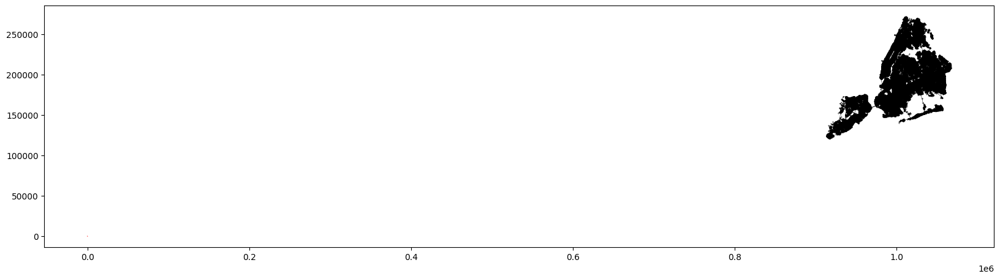

In [142]:
NY = ox.graph_from_place('New York, United States', network_type='drive',simplify=True)

# Plot the base graph
fig, ax = plt.subplots(figsize=(20, 20))
area.plot(ax = ax, facecolor = 'White')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'Black', facecolor = 'white')
nodes.plot(ax= ax, color = 'Black', markersize = 0.1)

# Plot the street segments on top of the map
gdf.plot(ax=ax, color='red', linewidth=0.1)

# Show the plot
plt.show()

In [95]:
lion_data = lion_data.iloc[5000:6000]

# Function to find edge by street names

def find_edge_by_street_names(graph, from_street, to_street):
    for u, v, key, data in graph.edges(keys=True, data=True):
        if from_street in data.get('name', '') and to_street in data.get('name', ''):
            return (u, v, key)
    return None

# Add columns for OSMNX segment information
lion_data['osmid'] = None
lion_data['u'] = None
lion_data['v'] = None

# Find and append the corresponding OSMNX segments
for idx, row in lion_data.iterrows():
    edge = find_edge_by_street_names(G, row['From'], row['To'])
    if edge:
        lion_data.at[idx, 'osmid'] = G.edges[edge].get('osmid')
        lion_data.at[idx, 'u'] = edge[0]
        lion_data.at[idx, 'v'] = edge[1]

# Display the first few rows of the dataset
print(lion_data.head())
nodes, edges = ox.graph_to_gdfs(G)

Empty DataFrame
Columns: [ID, SegmentID, Roadway Name, From, To, Direction, Date, 12:00-1:00 AM, 1:00-2:00AM, 2:00-3:00AM, 3:00-4:00AM, 4:00-5:00AM, 5:00-6:00AM, 6:00-7:00AM, 7:00-8:00AM, 8:00-9:00AM, 9:00-10:00AM, 10:00-11:00AM, 11:00-12:00PM, 12:00-1:00PM, 1:00-2:00PM, 2:00-3:00PM, 3:00-4:00PM, 4:00-5:00PM, 5:00-6:00PM, 6:00-7:00PM, 7:00-8:00PM, 8:00-9:00PM, 9:00-10:00PM, 10:00-11:00PM, 11:00-12:00AM, osmid, u, v]
Index: []

[0 rows x 34 columns]


C:\Users\pingn\AppData\Local\Temp\ipykernel_12024\1160355738.py:7: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  matched_edges.plot(ax=ax, color='red', linewidth=2)


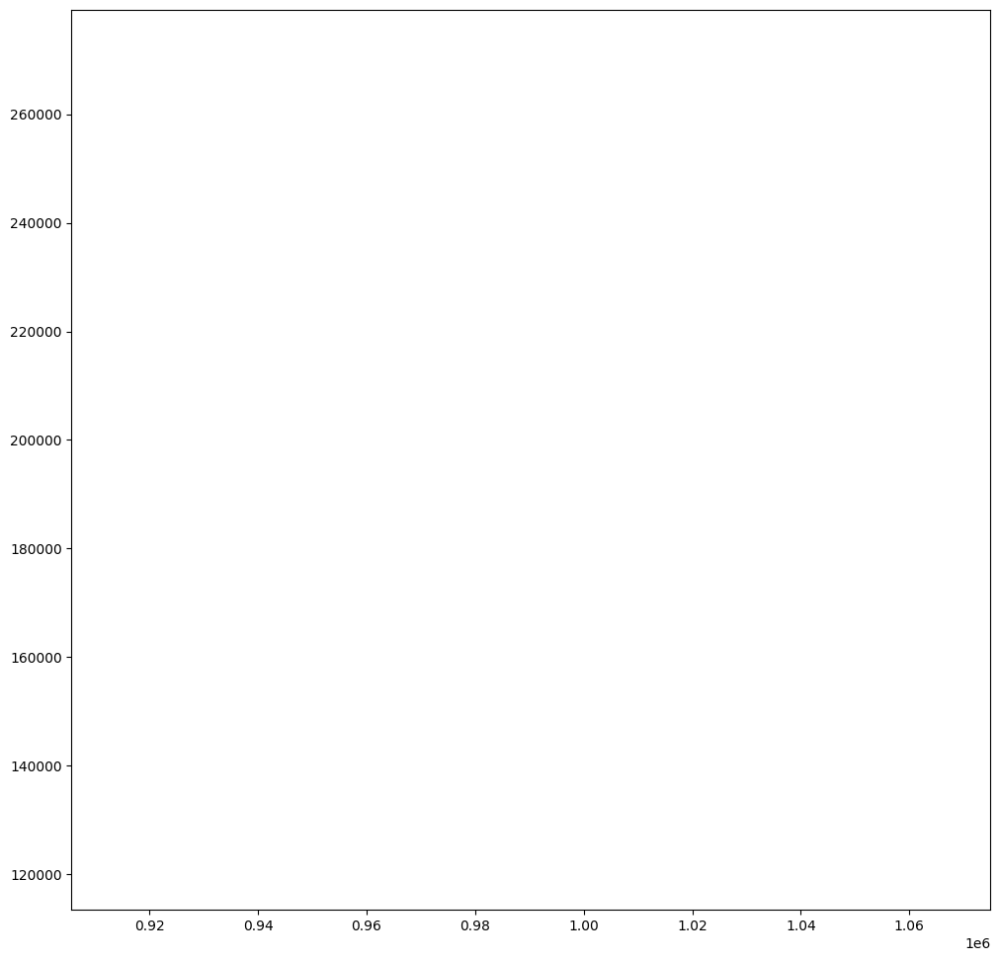

In [92]:
# Filter the edges GeoDataFrame to only include matched segments
matched_edges = edges[edges.index.isin(lion_data[['u', 'v']].dropna().apply(tuple, axis=1))]


# Plot the street network and the matched segments
fig, ax = plt.subplots(figsize=(12, 12))
area.plot(ax = ax, facecolor = 'white')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'black', facecolor = 'white')
nodes.plot(ax= ax, color = 'white', markersize = .1)
edges.plot(ax=ax, linewidth=1, edgecolor='white')
matched_edges.plot(ax=ax, color='red', linewidth=2)

plt.show()

In [ ]:
osm_crs=G.graph["crs"]  #coordinate system
osm_crs

In [ ]:
ac_streets=ox.projection.project_gdf(ac_streets, to_crs=osm_crs, to_latlong=False) #https://osmnx.readthedocs.io/en/stable/user-reference.html#osmnx.projection.project_gdf
ac_streets  #after projection -> this is an edges geodataframe that has information about the geometry

In [ ]:
url_traffic = "https://raw.githubusercontent.com/ManolyaLN/GraphML_Repo/Manolya/02-Datasets/Traffic_Volume_Counts_20240524.csv"
urllib.request.urlretrieve(url_traffic, 'nyc_traffic_volume_counts.csv')

In [ ]:
ftraffic = pd.read_csv('nyc_traffic_volume_counts.csv')

In [ ]:
print(df_traffic.head())

In [ ]:
print(df_traffic.dtypes)

## Traffic test for Manhattan

In [58]:
traffic_df = pd.read_csv("https://raw.githubusercontent.com/ManolyaLN/GraphML_Repo/Manolya/02-Datasets/points_with_community.csv")

In [59]:
geometry = [Point(xy) for xy in zip(traffic_df.longitude, traffic_df.latitude)]

In [60]:
gdf = gpd.GeoDataFrame(traffic_df, geometry=geometry)

In [61]:
print(gdf.head())

    latitude  longitude  sub-district  traffic_density  \
0  40.684791 -74.021912          24.0        90.978964   
1  40.685139 -74.021137          24.0        90.978964   
2  40.685550 -74.020236          24.0        90.978964   
3  40.685824 -74.025872          24.0        90.978964   
4  40.685994 -74.025888          24.0        90.978964   

                     geometry  
0  POINT (-74.02191 40.68479)  
1  POINT (-74.02114 40.68514)  
2  POINT (-74.02024 40.68555)  
3  POINT (-74.02587 40.68582)  
4  POINT (-74.02589 40.68599)  


In [62]:
gdf.set_crs(epsg=4326, inplace=True)

,latitude,longitude,sub-district,traffic_density,geometry
0,40.684791,-74.021912,24.0,90.978964,POINT (-74.02191 40.68479)
1,40.685139,-74.021137,24.0,90.978964,POINT (-74.02114 40.68514)
2,40.685550,-74.020236,24.0,90.978964,POINT (-74.02024 40.68555)
3,40.685824,-74.025872,24.0,90.978964,POINT (-74.02587 40.68582)
4,40.685994,-74.025888,24.0,90.978964,POINT (-74.02589 40.68599)
...,...,...,...,...,...
995,40.871043,-73.915746,4.0,527.553424,POINT (-73.91575 40.87104)
996,40.871161,-73.914010,4.0,31.511706,POINT (-73.91401 40.87116)
997,40.871655,-73.911227,4.0,31.511706,POINT (-73.91123 40.87166)
998,40.873237,-73.911515,4.0,31.511706,POINT (-73.91152 40.87324)


In [63]:
gdf.to_file("output_file.gpkg", driver="GPKG")

In [100]:
url = "https://github.com/ManolyaLN/GraphML_Repo/raw/Manolya/02-Datasets/output_file.gpkg"
urllib.request.urlretrieve(url, 'file_1.gpkg')
url_p1='/content/file_1.gpkg'

In [101]:
points_gdf = gpd.read_file(url)

In [ ]:
print("Columns in the GeoDataFrame:")
print(points_gdf.columns)

In [ ]:
print("Original CRS:", points_gdf.crs)

In [ ]:
pcs = "EPSG:2263"  # NAD83 / New York Long Island

In [ ]:
points_gdf = points_gdf.to_crs(pcs)

In [ ]:
print("Columns in the GeoDataFrame:")
print(points_gdf.columns)

In [ ]:
polygons_list = []

In [ ]:
for name, group in points_gdf.groupby('sub-district'):
    # Create a MultiPoint object from the group
    multipoint = MultiPoint(group.geometry.tolist())
    # Create a convex hull polygon from the MultiPoint object
    polygon = multipoint.convex_hull
    # Create a dictionary with sub_district, traffic_density, and geometry
    polygon_dict = {
        'sub-district': name,
        'traffic_density': group['traffic_density'].mean(),  # Calculate average traffic density
        'geometry': polygon
    }
    polygons_list.append(polygon_dict)

In [ ]:
polygons_gdf = gpd.GeoDataFrame(polygons_list, crs=points_gdf.crs)

In [ ]:
print(polygons_gdf.head())
polygons_gdf.plot(column='traffic_density', legend=True)
plt.axis("off")
plt.title("Traffic Density by Sub-District", fontsize=10)
plt.show()

## All Features with Graph

# Check Correlation

In [ ]:
pip install phik

In [ ]:
import phik
from phik.report import plot_correlation_matrix
from phik import report
import seaborn as sns
import warnings

In [ ]:
attributes_to_check = ['attributes_01_0', 'attributes_01_1', 'attributes_01_2', 'attributes_01_3', 'attributes_02', 'attributes_03_0', 'attributes_03_1', 'attributes_03_2']
data_to_check = nodes[attributes_to_check]

In [ ]:
warnings.filterwarnings("ignore")

plt.figure(figsize=(10, 5))
heatmap = sns.heatmap(data_to_check.phik_matrix(), annot=True);
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

# Assigning Classes

Describe what will be your classification criteria --

Load dataset or alternative data strategy

Assign classes to node/edges

Plot classes with graph

# DGL Graph

Include features and classes as attributes to the city Graph

Convert networkx graph to DGL graph

Add features to DGL graph

In [ ]:
#Get dgl graph
graph=dgl.from_networkx(G, node_attrs=nodes_attributes_list)

In [ ]:
graph

In [ ]:
graph.ndata